# Imports

In [21]:
import os
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import pandas as pd
from PIL import Image
from matplotlib.patches import Polygon
from matplotlib.cm import ScalarMappable
from matplotlib.colors import Normalize
from matplotlib.lines import Line2D
import math
import sys
import os

folder_path = os.getcwd()

sys.path.append(folder_path + '/tangent and angle code')
from rose_diagram import *
from check_bimodality import *

# Function definitions

In [22]:
def plot_line_segment(point, slope, length):
    # Plots a line segment
    # Inputs: 
    # point = coordinates of the point in decimal degrees
    # slope = slope of the line
    # length = length of the line
    # Outputs: 
    # [x0,x2],[y0,y2] = endpoints of the line

    y1, x1 = point
    if slope==0:
        dx = 5
        dy = 0
    else:
        slope = 1/slope

        dx = length / (2 * np.sqrt(1 + slope**2))
        dy = slope * dx

    x2 = x1 + dx
    y2 = y1 + dy

    x0 = x1 - dx
    y0 = y1 - dy

    return [x0,x2],[y0,y2]

def rose_diagram(angles, bin_width):
    # Creates a histogram of concretion trends
    # Inputs: 
    # angles = concretion trends in degrees, where north=0
    # bin_width = angular width of the bins in degrees
    # Outputs: 
    # theta_symmetrical = angles of the histogram bins
    # hist_symmetrical = heights of the histogram bins

    # Define the bins
    bins = np.arange(-90, 91, bin_width)  # Bins of width 1 from -90 to 90

    # Create the histogram
    hist, edges = np.histogram(angles, bins=bins)

    # Convert bin edges to radians for polar plot
    theta_original = np.radians(edges[:-1])

    # Duplicate the data for angles greater than 90 degrees and less than -90 degrees
    theta_symmetrical = np.concatenate([theta_original, theta_original + np.pi])

    # Duplicate the histogram values
    hist_symmetrical = np.concatenate([hist, hist])
    
    return theta_symmetrical, hist_symmetrical

def haversine_distance(lat1, lon1, lat2, lon2): 
    # Calculates the great circle distance between two points on the earth, specified in decimal degrees
    # Inputs: 
    # lat1, lon1, lat2, lon2 = coordinates of the two points
    # Outputs:
    # distance between the two points, approximated using the Haversine formula
    
    # Convert decimal degrees to radians
    lat1, lon1, lat2, lon2 = map(math.radians, [lat1, lon1, lat2, lon2])

    # Haversine formula
    dlon = lon2 - lon1
    dlat = lat2 - lat1
    a = math.sin(dlat/2)**2 + math.cos(lat1) * math.cos(lat2) * math.sin(dlon/2)**2
    c = 2 * math.atan2(math.sqrt(a), math.sqrt(1-a))
    # Radius of earth in kilometers is 6371
    km = 6371 * c
    # Convert to meters
    return km * 1000

def calculate_angle(slope):
    # Calculates the angle of a line from its slope
    # Inputs: 
    # slope = slope of a line
    # Outputs: 
    # angle = angle of the line, where north=0
    if np.abs(slope)<=1e-6:
        return 0
    if slope==float('inf'):
        return 90
    dx = 1
    dy = slope
    angle = np.degrees(-np.arcsin(dy / np.sqrt(dx**2 + dy**2) )) # the minus sign makes the result agree with angle definition
    return angle

def calculate_slope(angle):
    # Calculates the slope of a line from its angle
    # Inputs: 
    # angle = angle of the line, where north=0
    # Outputs: 
    # slope = slope of the line
    if np.abs(angle) <= 1e-6:
        return 0
    if np.abs(angle - 90) <= 1e-6:
        return float('inf')
    dx = 1
    dy = np.tan(np.radians(angle))
    slope = - dy / dx
    return slope

def transform_angles(angles):
    # Converts angles from [0, 180] to [-90, 90]
    # Input: 
    # angles = angles to convert
    # Output: 
    # converted angles
    return (angles + 90) % 180 - 90

# Import data

In [23]:
folder_path = os.getcwd()
file_name = 'RawData_v2.csv'
file_path = folder_path + '/' + file_name
image_path = folder_path + '/blank_basemap.png'

# Import data
data = pd.read_csv(file_path).values

In [24]:
lon = data[:, 1]
lat = data[:, 2]
elev = data[: ,3]
trend = data[:, 4]
elevKP = data[:, 5]
elevdiff = data[:, 6]

In [25]:
N = len(lon)
print("Number of data points: ", N)

Number of data points:  2941


# Import basemap

In [26]:
# Import basemap
basemap = plt.imread(image_path)

# Boundary coordinates of the basemap in decimal degrees
ymin = 46.999909 
xmin = -107.999379
xmax = -105.826994
ymax = 48.061238

# Make data bins

In [27]:
# Data bins
# -100 to -36 m above KPB
# -36 to 0 m above KPB
# 0 to 25 m above KPB
# 25 to 50 m above KPB
# 50 to 75 m above KPB
# 75 to 100 m above KPB
# 100 to 125 m above KPB

bin1 = data[(data[:, 6] >= -100) & (data[:, 6] < -36)]
bin2 = data[(data[:, 6] >= -36) & (data[:, 6] < 0)]
bin3 = data[(data[:, 6] >= 0) & (data[:, 6] < 25)]
bin4 = data[(data[:, 6] >= 25) & (data[:, 6] < 50)]
bin5 = data[(data[:, 6] >= 50) & (data[:, 6] < 75)]
bin6 = data[(data[:, 6] >= 75) & (data[:, 6] < 100)]
bin7 = data[(data[:, 6] >= 100) & (data[:, 6] < 125)]

latitudes = []
longitudes = []

bins = [bin1, bin2, bin3, bin4, bin5, bin6, bin7]
for bin_data in bins:
    latitudes.append(bin_data[:, 2])
    longitudes.append(bin_data[:, 1])
lat1, lat2, lat3, lat4, lat5, lat6, lat7 = latitudes
lon1, lon2, lon3, lon4, lon5, lon6, lon7 = longitudes

# Plot all data

In [28]:
# first, calculate the slopes from the given angles
slopes = []
for i in range(N):
  slopes.append(calculate_slope(trend[i]))

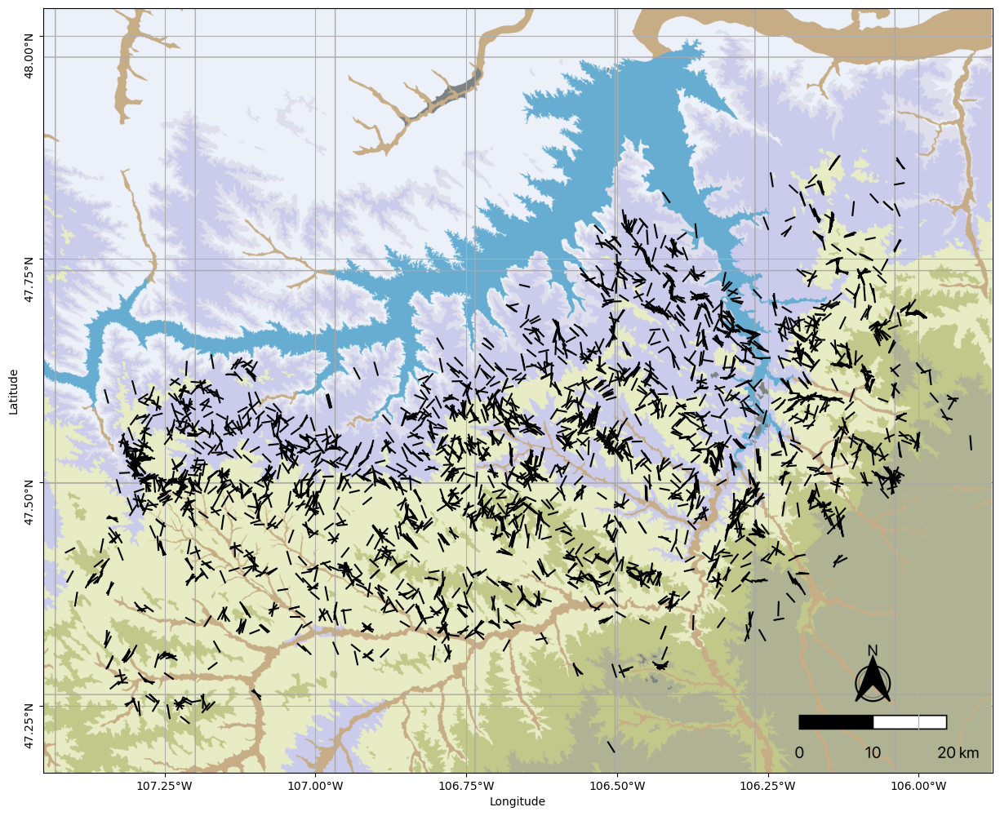

In [29]:
aspect_ratio = 111194.92664455889/75077.92837945123 

width = 15
height = width * aspect_ratio
fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(width, height))
ax.imshow(basemap, extent=[xmin, xmax, ymin, ymax])

# Set ticks and grid lines every 0.25° longitude and 0.25° latitude
plt.xticks(np.arange(xmin, xmax, 0.25)[1:])
plt.yticks(np.arange(ymin, ymax, 0.25))
plt.grid(True)

for i in range(N):
  pix = [lat[i], lon[i]]
  slope_av = slopes[i]

  # convert angle to radians
  trend_rad = np.radians(trend[i])

  # set line length
  line_length = 0.015

  if np.abs(slope_av) < 1e-5:
    continue
  
  else:
      # Compute the start and end points of the lines
      dx = line_length * np.sin(trend_rad) / 2
      dy = line_length * np.cos(trend_rad) / 2
      x_start = lon[i] - dx
      y_start = lat[i] - dy
      x_end = lon[i] + dx
      y_end = lat[i] + dy

      # Plot the lines
      plt.plot([x_start, x_end], [y_start, y_end], color='black')

x_tick_labels = [f'{abs(x):.2f}°{"E" if x >= 0 else "W"}' for x in plt.xticks()[0]]
y_tick_labels = [f'{abs(y):.2f}°{"N" if y >= 0 else "S"}' for y in plt.yticks()[0]]
plt.gca().set_xticklabels(x_tick_labels)
plt.gca().set_yticklabels(y_tick_labels, rotation=90)

plt.xlim(-107.45, xmax-0.05)
plt.ylim(47.175, ymax-0.03)

# Set the aspect ratio of the axes
plt.gca().set_aspect(aspect_ratio)

# Set the axis labels
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.show()

# Make boxes

In [30]:
bin_boundaries = [
    (-100, -36),
    (-36, 0),
    (0, 25),
    (25, 50),
    (50, 75),
    (75, 100),
    (100, 125),
    (125, 200)]

# x- and y-distance of image dimensions in m
dy = 118014.40030074268 # y-distance in m
dx = 164737.29212750084 # x-distance in m

box_size = 5000 # in m

# Define the number of boxes in each dimension
num_boxes_x = int(dx / box_size)
num_boxes_y = int(dy / box_size)

# Calculate the width and height of each box in decimal degrees
box_width_deg = (xmax - xmin) / num_boxes_x
box_height_deg = (ymax - ymin) / num_boxes_y

# Initialize a list to store the box outlines and corresponding data for each box
boxes = []

# Iterate over each box
for i in range(num_boxes_y):
    for j in range(num_boxes_x):
        # Calculate the coordinates of the four corners of the box
        left_lon = xmin + j * box_width_deg
        right_lon = xmin + (j + 1) * box_width_deg
        bottom_lat = ymin + i * box_height_deg
        top_lat = ymin + (i + 1) * box_height_deg
        
        # Create the box outline
        box_outline = [
            (left_lon, bottom_lat), 
            (right_lon, bottom_lat),
            (right_lon, top_lat), 
            (left_lon, top_lat), 
            (left_lon, bottom_lat)
        ]

        # Get data points that fall within the current box
        box_data = data[(data[:, 1] >= left_lon) & 
                        (data[:, 1] < right_lon) & 
                        (data[:, 2] >= bottom_lat) & 
                        (data[:, 2] < top_lat)]

        # Create bins for this box
        bins_data = []
        for bin_index in range(len(bin_boundaries)):
            bin_samples = box_data[(box_data[:, 6] >= bin_boundaries[bin_index][0]) & 
                                   (box_data[:, 6] < bin_boundaries[bin_index][1])]
            bins_data.append(np.array(bin_samples))  # Convert to NumPy array
            
        # Check if bins_data contains any non-empty bins
        if any(len(bin) > 0 for bin in bins_data):
            # If at least one bin is non-empty, append to boxes
            boxes.append((box_outline, bins_data))

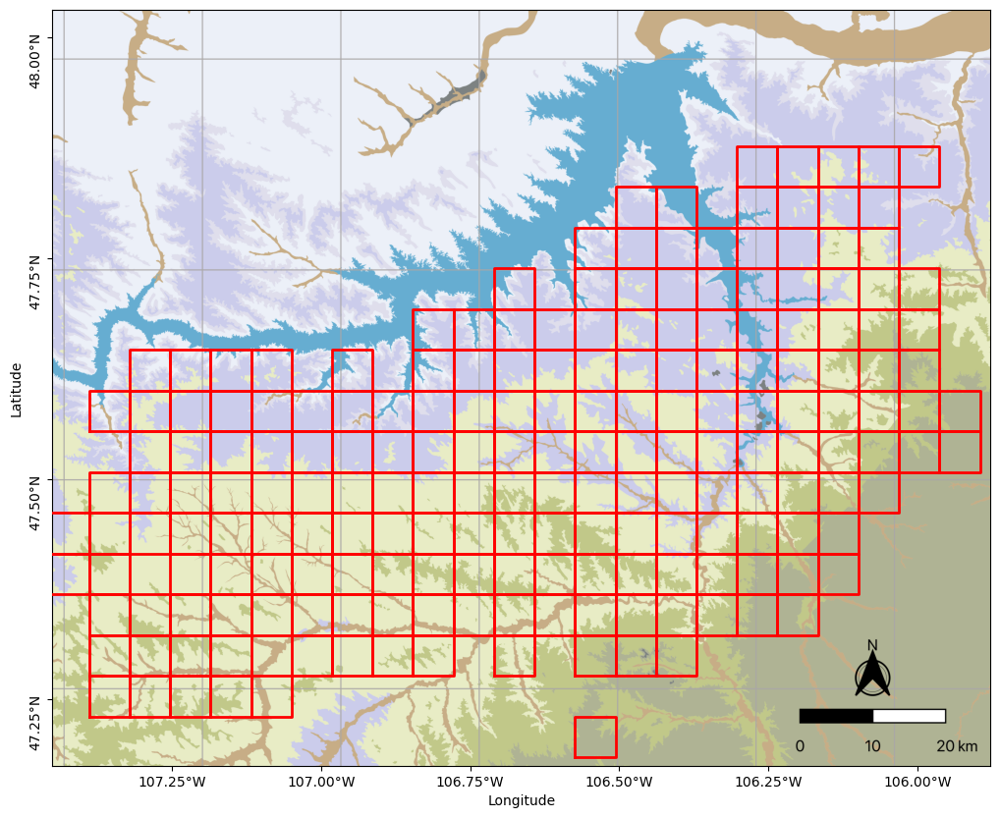

In [31]:
min_lon = np.min(lon)
min_lat = np.min(lat)
max_lon = np.max(lon)
max_lat = np.max(lat)

box_coords = []

# Iterate through each box in the boxes list
for box in boxes:
    box_outline = box[0]  # Get the box outline
    box_coords.append(box_outline)  # Append to the list
box_coords = np.array(box_coords)

width = 10
height = width * aspect_ratio
fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(height, width))

# Add the basemap to the plot
ax.imshow(basemap, extent=[xmin, xmax, ymin, ymax])

ax.set_xticks(np.arange(xmin, xmax, 0.25)[1:])
ax.set_yticks(np.arange(ymin, ymax, 0.25))

for coord in box_coords:
    plt.plot(*zip(*coord), color='red', linewidth=2.0, zorder=3)

x_tick_labels = [f'{abs(x):.2f}°{"E" if x >= 0 else "W"}' for x in plt.xticks()[0]]
y_tick_labels = [f'{abs(y):.2f}°{"N" if y >= 0 else "S"}' for y in plt.yticks()[0]]
plt.gca().set_xticklabels(x_tick_labels)
plt.gca().set_yticklabels(y_tick_labels, rotation=90)

plt.xlim(-107.45, xmax-0.05)
plt.ylim(47.175, ymax-0.03)

# Set the aspect ratio of the axes
plt.gca().set_aspect(aspect_ratio)

# Set the axis labels
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.show()

# Plot data density heat map

In [32]:
# Initialize a dictionary to store the count of data points in each box
data_point_count = {}

# Iterate over each data point and count how many fall into each box
for lon_point, lat_point in zip(lon, lat):
    # Find the box index for the current data point
    box_x_index = int((lon_point - xmin) // box_width_deg)
    box_y_index = int((lat_point - ymin) // box_height_deg)

    # If the box index is within the valid range, increment the count for that box
    if 0 <= box_x_index < num_boxes_x and 0 <= box_y_index < num_boxes_y:
        box_index = (box_x_index, box_y_index)
        data_point_count[box_index] = data_point_count.get(box_index, 0) + 1

In [33]:
# Calculate the area of each box in square kilometers
box_area_km2 = (box_size/1000)**2   # Approximate conversion from degrees to km

# Initialize a dictionary to store the sample density in each box
sample_density = {}

# Calculate the sample density in samples/km^2 for each box
for box_index, count in data_point_count.items():
    sample_density[box_index] = count / box_area_km2

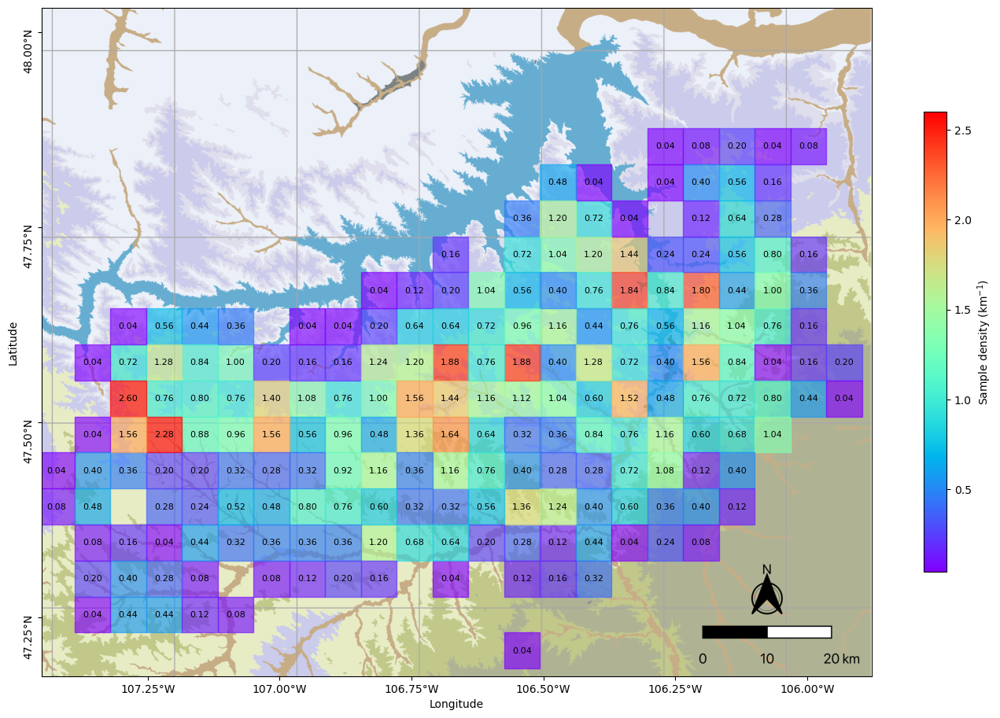

In [34]:
# Create the plot with the specified width and height
width = 10
height = width * aspect_ratio

fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(height, width))
plt.subplots_adjust(left=0.1, right=0.99, top=0.95, bottom=0.05)

# Add the basemap to the plot
ax.imshow(basemap, extent=[xmin, xmax, ymin, ymax])

ax.set_xticks(np.arange(xmin, xmax, 0.25)[1:])
ax.set_yticks(np.arange(ymin, ymax, 0.25))

# Set the aspect ratio of the axes
plt.gca().set_aspect(aspect_ratio)

# Set the axis labels
plt.xlabel('Longitude')
plt.ylabel('Latitude')

# Initialize lists to store coordinates and colors for plotting rectangles
rect_coords = []
rect_colors = []

# Iterate over each box and check if the sampling density is > 0
for box_index, density in sample_density.items():
    if density > 0:
        lon_min = xmin + box_index[0] * box_width_deg
        lon_max = xmin + (box_index[0] + 1) * box_width_deg
        lat_min = ymin + box_index[1] * box_height_deg
        lat_max = ymin + (box_index[1] + 1) * box_height_deg

        # Store coordinates and color based on sampling density
        rect_coords.append([(lon_min, lat_min), (lon_max, lat_min), (lon_max, lat_max), (lon_min, lat_max)])
        rect_colors.append(density)

# Find the minimum and maximum density values
min_density = min(rect_colors)
max_density = 2.0

# Plot rectangles with color mapped to sampling density
for coords, color in zip(rect_coords, rect_colors):
    plt.fill(*zip(*coords), color=plt.cm.rainbow((color - min_density) / (max_density - min_density)),
             alpha=0.65, zorder=2)

    # Add text label for sample density
    plt.text((coords[0][0] + coords[2][0]) / 2, (coords[0][1] + coords[2][1]) / 2,
             f"{color:.2f}", color='black', ha='center', va='center', fontsize=8)

# Create a ScalarMappable object to use for colorbar
norm = Normalize(vmin=min(rect_colors), vmax=max(rect_colors))
sm = ScalarMappable(norm=norm, cmap='rainbow')
sm.set_array([])

# Add color bar
cbar = fig.colorbar(sm, ax=ax, label='Sample density (km$^{-1}$)', shrink=0.65)

x_tick_labels = [f'{abs(x):.2f}°{"E" if x >= 0 else "W"}' for x in plt.xticks()[0]]
y_tick_labels = [f'{abs(y):.2f}°{"N" if y >= 0 else "S"}' for y in plt.yticks()[0]]
plt.gca().set_xticklabels(x_tick_labels)
plt.gca().set_yticklabels(y_tick_labels, rotation=90)

plt.xlim(-107.45, xmax-0.05)
plt.ylim(47.175, ymax-0.03)

# Set the aspect ratio of the axes
plt.gca().set_aspect(aspect_ratio)

# Set the axis labels
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.show()

# Plot clustered data map

In [35]:
# Step 1: Import data
df = pd.read_csv("clustered_data.csv")


In [36]:
# Step 2: Function to check if a point (lat, lon) is inside a polygon (box)
def is_point_in_box(lat, lon, box):
    n = len(box)
    inside = False
    x_intercept = 0
    p1x, p1y = box[0]
    
    for i in range(n + 1):
        p2x, p2y = box[i % n]
        if lat > min(p1y, p2y):
            if lat <= max(p1y, p2y):
                if lon <= max(p1x, p2x):
                    if p1y != p2y:
                        xinters = (lat - p1y) * (p2x - p1x) / (p2y - p1y) + p1x
                    if p1x == p2x or lon <= xinters:
                        inside = not inside
        p1x, p1y = p2x, p2y

    return inside

# Step 3: Create a list to store results
data_structure = []

# Step 4: Iterate over each data point and check which box it falls into
for index, row in df.iterrows():
    lat = row['latitude']
    lon = row['longitude']
    cluster = row['Cluster #']
    
    for i, (box_coords, _) in enumerate(boxes):
        if is_point_in_box(lat, lon, box_coords):
            data_structure.append({
                'latitude': lat,
                'longitude': lon,
                'box': i,
                'cluster': cluster
            })
            break  # Exit the loop once a box is found

# Step 5: Check if all Cluster #s within each box match
box_clusters = {}

# Group by box index and check clusters for each box
for entry in data_structure:
    box = entry['box']
    cluster = entry['cluster']
    if box not in box_clusters:
        box_clusters[box] = set()
    box_clusters[box].add(cluster)

# Step 6: Print the results for each box
for box, clusters in box_clusters.items():
    if len(clusters) != 1:
        print(f"Box {box}: No")

Choose color map here.

In [37]:
colors = [
    ("0", "#fefc4eb8", "1"),
    ("1", "#a593fcb8", "2"),
    ("2", "#72f5f3b8", "3"),
    ("3", "#ff7abeb8", "4"),
    ("4", "#76ff81b8", "5"),
     ("5", "#00000099", "noise")   
]

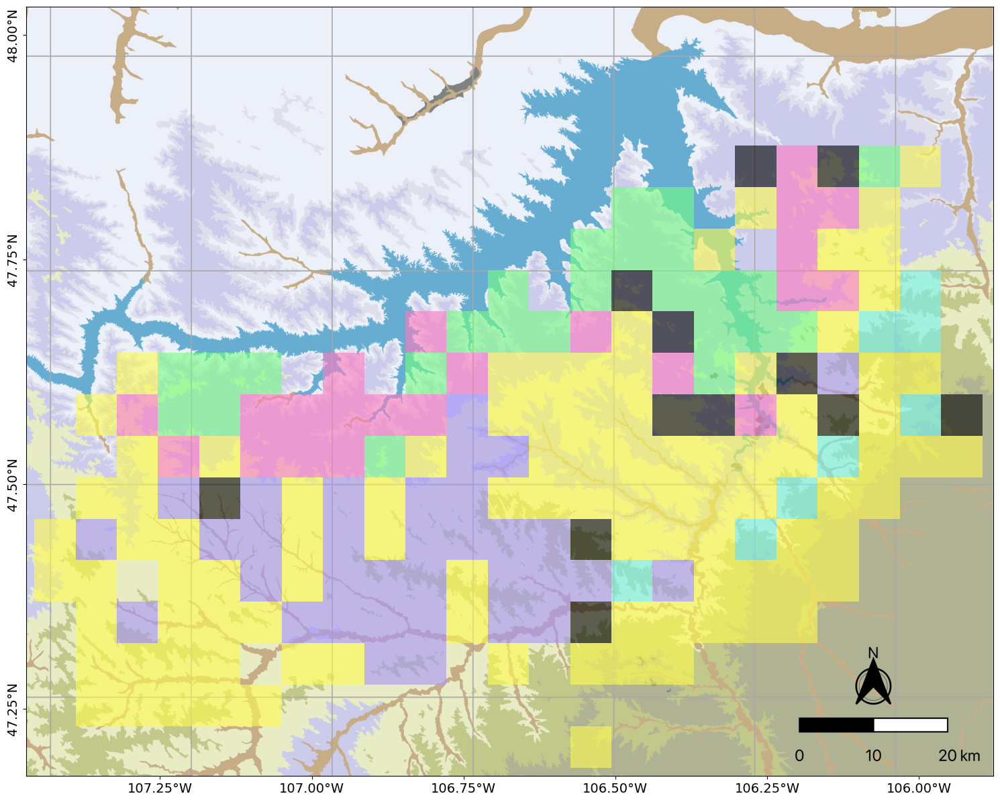

In [38]:
# Step 1: Assign the correct cluster value to each box
box_clusters_assigned = {}

# For each box, we know the cluster values are consistent, so we pick the first one.
for entry in data_structure:
    box = entry['box']
    cluster = str(int(entry['cluster']))
    if box not in box_clusters_assigned:
        box_clusters_assigned[box] = cluster

# Step 2: Create a dictionary to map cluster # to its corresponding color
cluster_colors = {entry[0]: entry[1] for entry in colors}

width = 15
height = width * aspect_ratio

# Step 3: Plot the boxes with their respective colors
fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(width, height))
ax.imshow(basemap, extent=[xmin, xmax, ymin, ymax])

for i, (box_coords, _) in enumerate(boxes):
    # Get the assigned cluster for the current box
    assigned_cluster = box_clusters_assigned.get(i)
    if assigned_cluster is None:
        # Create a Polygon object for the box
        polygon = Polygon(box_coords, closed=True, facecolor="000000", alpha=0.6,
                          linewidth=1)
        ax.add_patch(polygon)
    if assigned_cluster is not None:
        # Get the color for the assigned cluster
        color = cluster_colors.get(str(assigned_cluster))
        # Create a Polygon object for the box
        polygon = Polygon(box_coords, closed=True, facecolor=color, alpha=0.6, linewidth=1)
        ax.add_patch(polygon)

# Set ticks and grid lines every 0.25° longitude and 0.25° latitude
plt.xticks(np.arange(xmin, xmax, 0.25)[1:])
plt.yticks(np.arange(ymin, ymax, 0.25))

plt.tick_params(axis='both', which='major', labelsize=14)

x_tick_labels = [f'{abs(x):.2f}°{"E" if x >= 0 else "W"}' for x in plt.xticks()[0]]
y_tick_labels = [f'{abs(y):.2f}°{"N" if y >= 0 else "S"}' for y in plt.yticks()[0]]
plt.gca().set_xticklabels(x_tick_labels)
plt.gca().set_yticklabels(y_tick_labels, rotation=90, verticalalignment='center')

plt.xlim(-107.47, xmax-0.05)
plt.ylim(47.175, ymax-0.03)


# Set the aspect ratio of the axes
plt.gca().set_aspect(aspect_ratio)

plt.tight_layout()

# Show the plot
plt.show()

# Legend

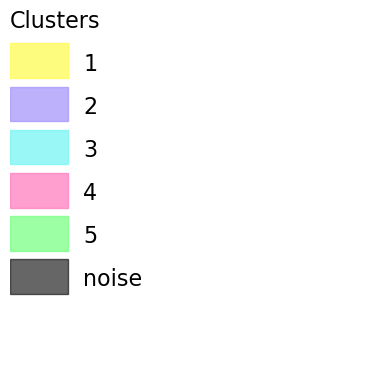

In [39]:
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle

# Create a blank figure
fig, ax = plt.subplots(figsize=(4, 4))
ax.axis('off')  # Turn off the axes

# Define positions for each element (x, y coordinates)
positions = {
    "title": (0.13, 1),
    "1": (0.0, 0.91),
    "2": (0.0, 0.7857),
    "3": (0.0, 0.6614),
    "4": (0.0, 0.5371),
    "5": (0.0, 0.4129),
    "noise": (0.0, 0.2887)
}

ax.text(*positions["title"], "Clusters", fontsize=16, ha="center", va="bottom")

for label, color, key in colors:
    x, y = positions[key]
    if color:  # Add a rectangle if color is specified
        ax.add_patch(Rectangle((x, y - 0.04), 0.1667, 0.1, color=color))
    ax.text(x + 0.21, y, key, fontsize=16, va="center")

plt.gca().set_aspect('equal')
plt.tight_layout()

# Show the figure
plt.show()

# Plot rose diagrams over time for each cluster

Time series for cluster  1


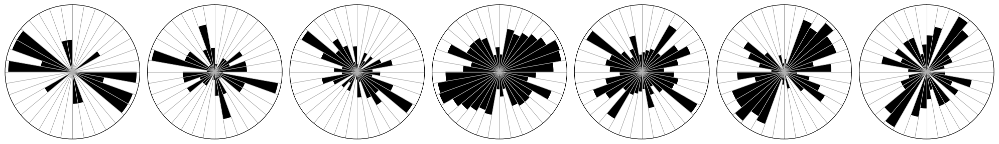



Time series for cluster  2


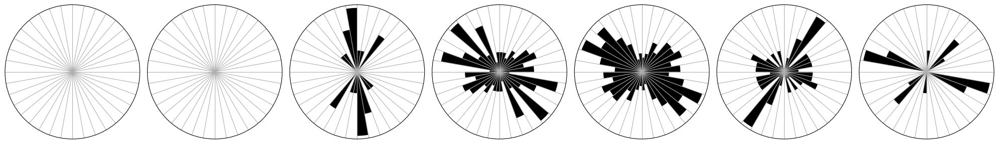



Time series for cluster  3


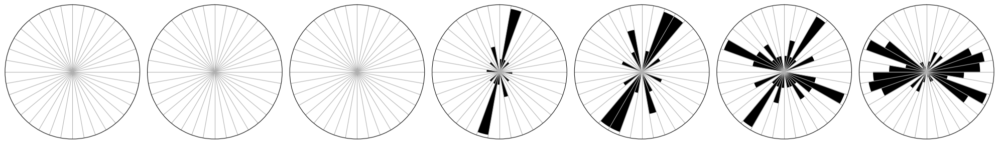



Time series for cluster  4


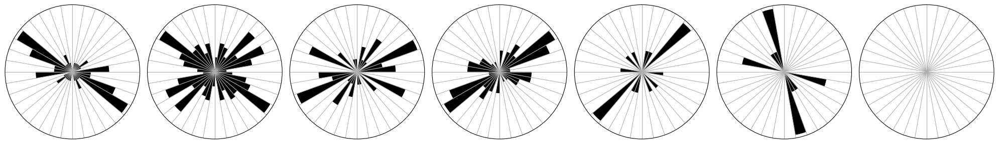



Time series for cluster  5


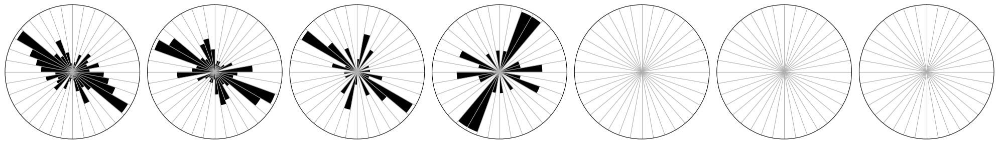



Time series for cluster  6


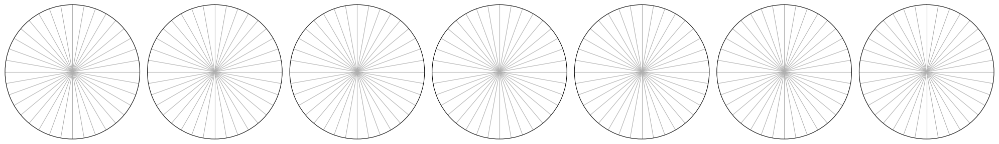

In [40]:
for label, color, key in colors:
    print("Time series for cluster ", int(label)+1)
    cluster_data = df[df["Cluster #"] == int(label)]

    # Create a figure with 1 row and 8 columns for subplots
    fig, axs = plt.subplots(1, 7, figsize=(20, 5), subplot_kw={'projection': 'polar'})

    # Initialize a variable to store the maximum radius
    max_radius = 1

    # Loop through each time bin (0 to 7)
    for bin_index in range(7):
        # Get data for the current time bin
        bin_data = cluster_data[cluster_data["Time bin"] == bin_index]
    
        # Create a polar plot for each subplot
        ax = axs[bin_index]
        ax.set_facecolor('white')

        if not bin_data.empty:
            # Extract angles (assuming "Trend" column contains the angles)
            angles = transform_angles(bin_data["Trend"].values)
            theta, hist = rose_diagram(angles, 10)

            # Plot the bar
            ax.bar(theta, hist, width=np.deg2rad(10), align='edge', color='black')


        else:
            # If no data, create an empty plot
            theta = np.linspace(0, 2 * np.pi, 36)
            hist = np.zeros_like(theta)
            ax.bar(theta, hist, width=np.deg2rad(10), align='edge', color='black', alpha=0.2)

        # Configure the polar plot
        ax.set_xticks(np.linspace(0, 2 * np.pi, 36, endpoint=False))
        ax.set_xticklabels([])
        ax.set_theta_direction(-1)
        ax.set_theta_offset(np.radians(90))
        ax.set_yticks([])  # Set y-ticks
        
        # Set the same maximum radius for all subplots
        #ax.set_ylim(0, 45)

    # Adjust layout
    plt.tight_layout()

    plt.show()
    print("\n")

# Check bimodality

Cluster 0 , time bin 1
N =  10


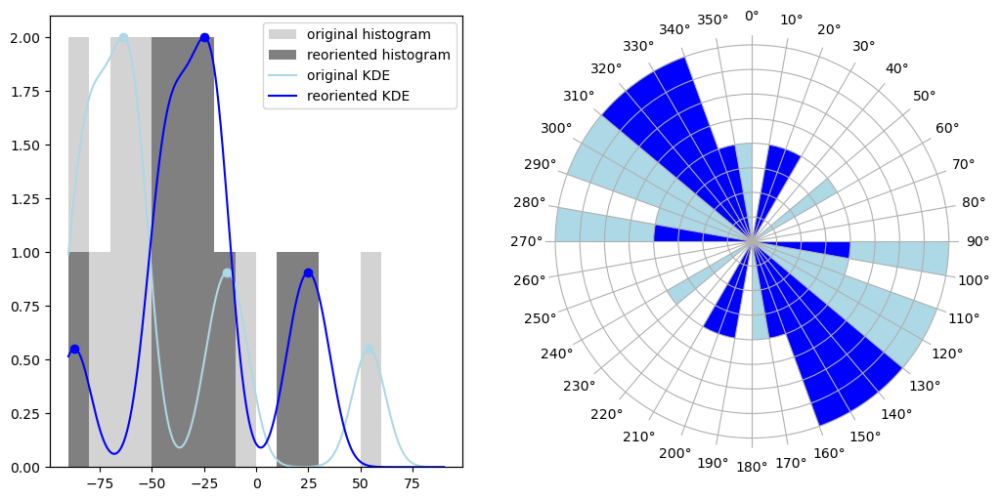

bimodality result:  False


Cluster 0 , time bin 2
N =  51


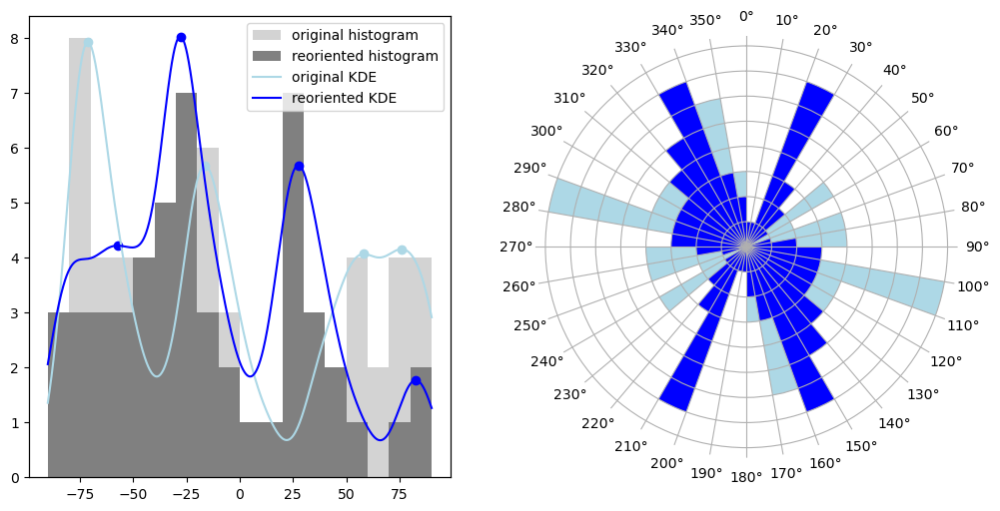

bimodality result:  False


Cluster 0 , time bin 3
N =  163


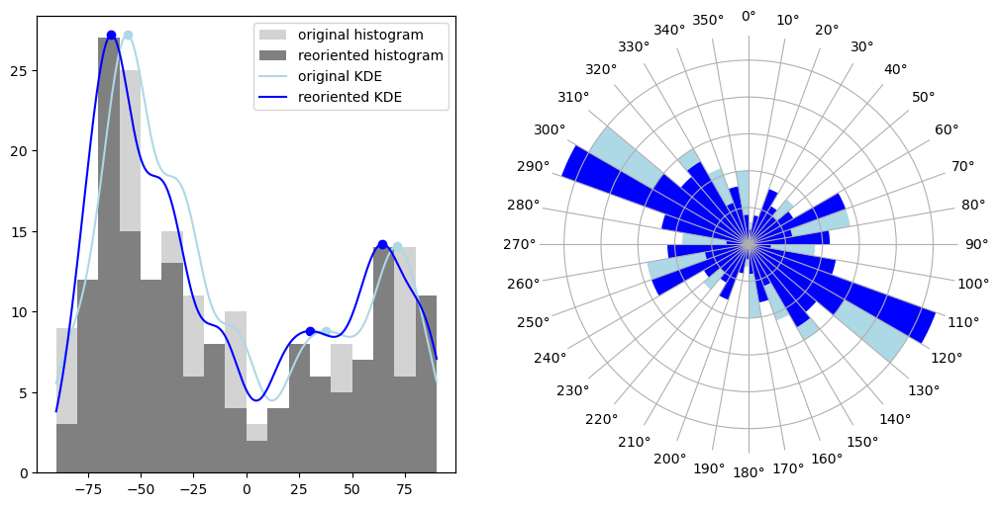

bimodality result:  False


Cluster 0 , time bin 4
N =  513


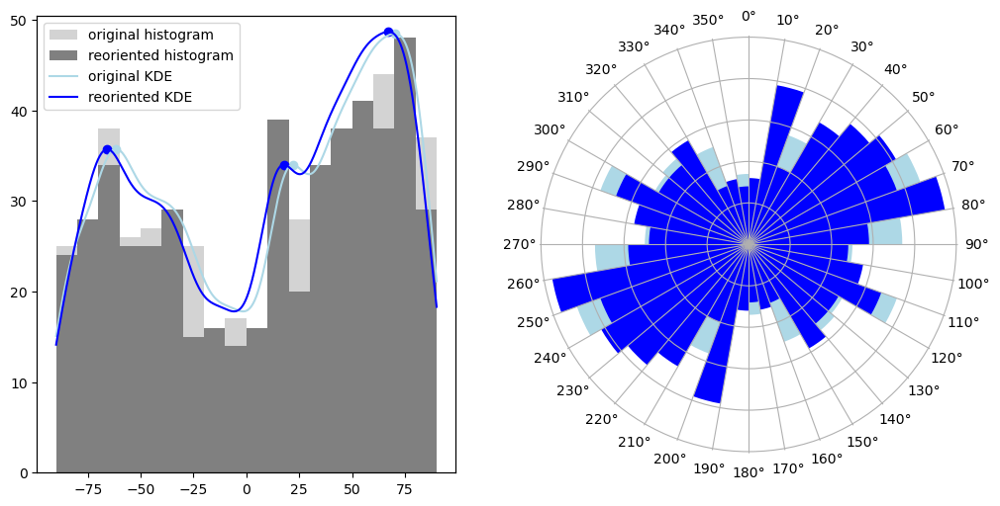

bimodality result:  False


Cluster 0 , time bin 5
N =  239


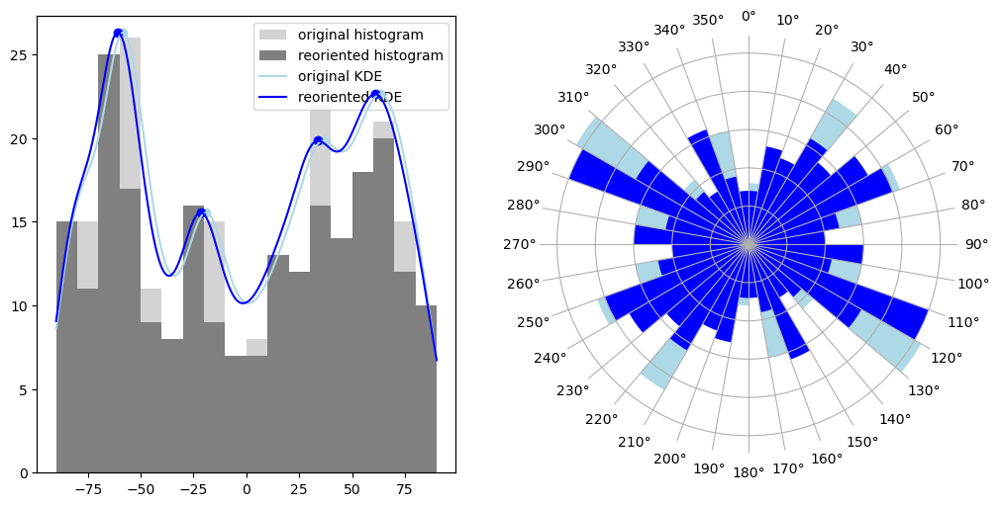

bimodality result:  False


Cluster 0 , time bin 6
N =  131


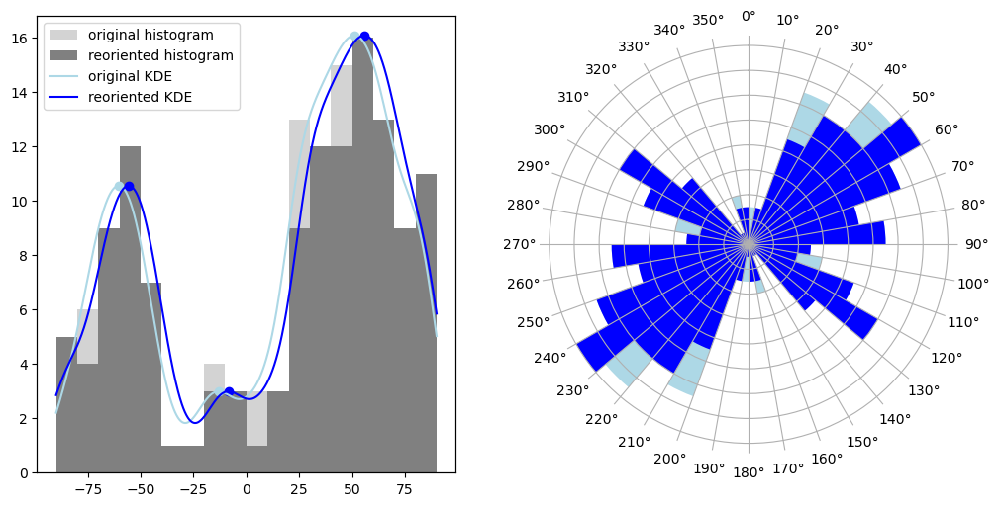

bimodality result:  True


Cluster 0 , time bin 7
N =  57


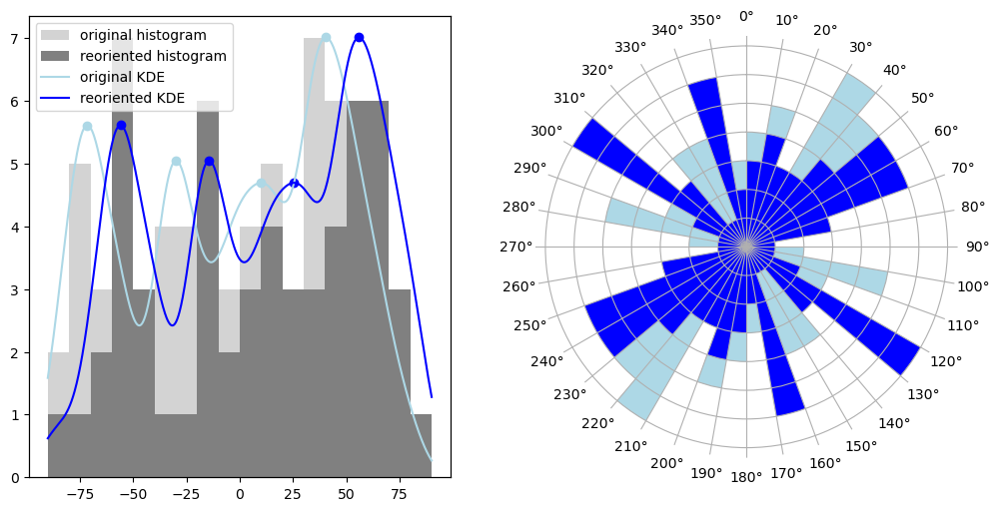

bimodality result:  False


Cluster 0 , time bin 8
N =  105


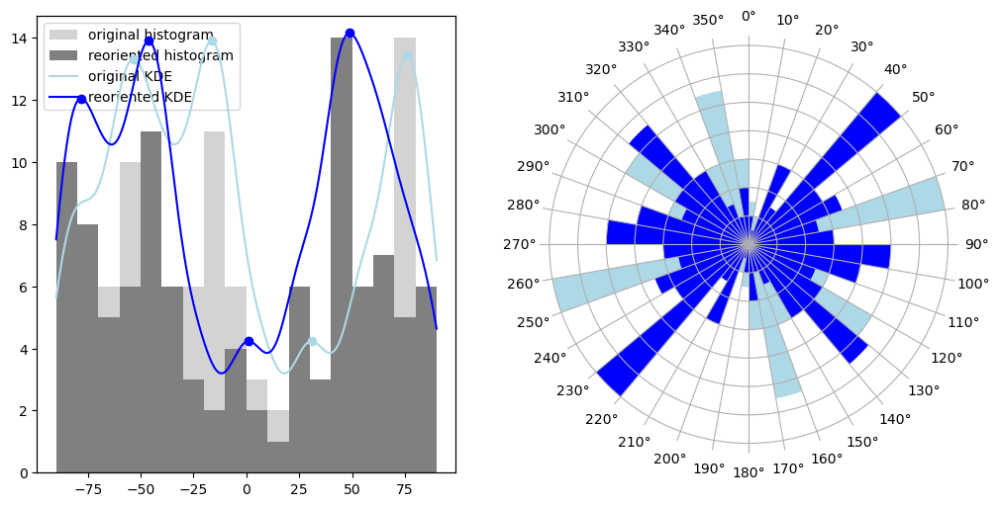

bimodality result:  False


Cluster 1 , time bin 1
N =  0
<10 data points


Cluster 1 , time bin 2
N =  0
<10 data points


Cluster 1 , time bin 3
N =  11


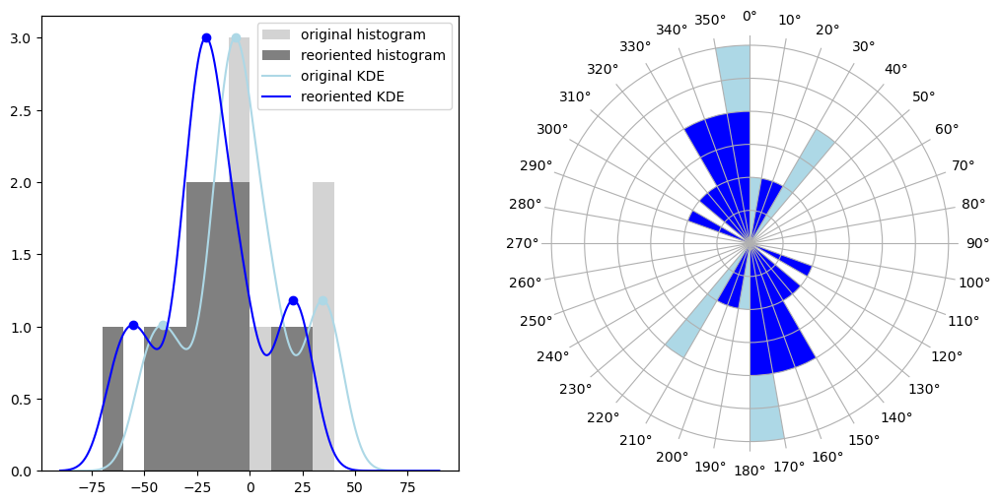

bimodality result:  False


Cluster 1 , time bin 4
N =  107


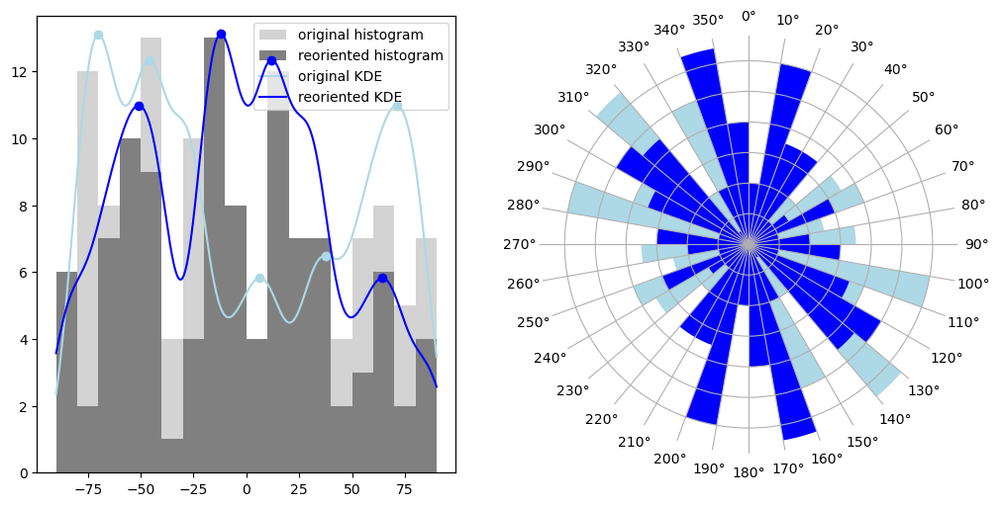

bimodality result:  False


Cluster 1 , time bin 5
N =  431


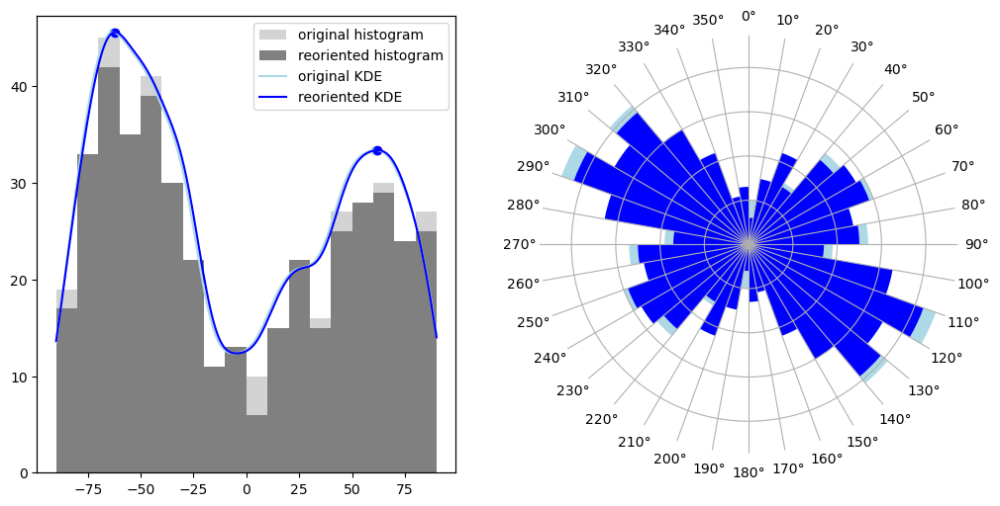

bimodality result:  True


Cluster 1 , time bin 6
N =  55


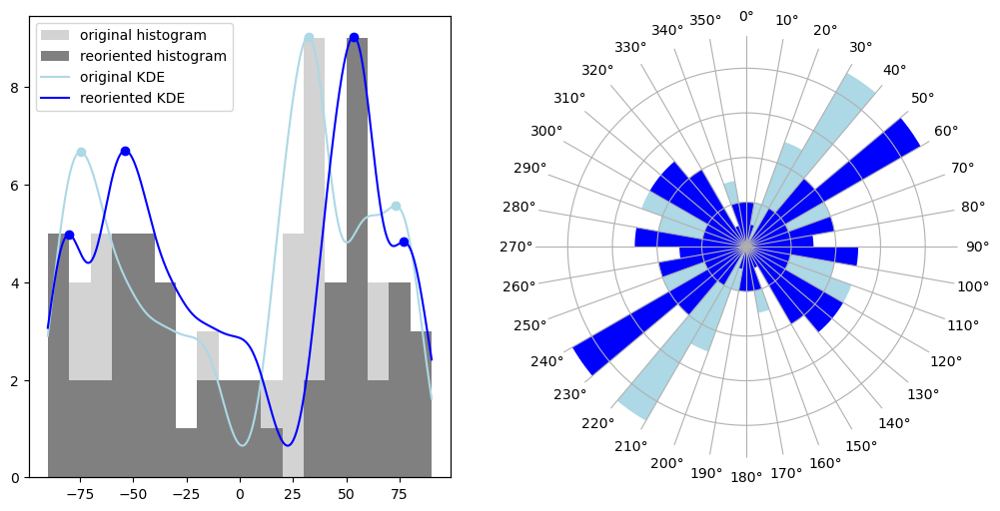

bimodality result:  False


Cluster 1 , time bin 7
N =  9


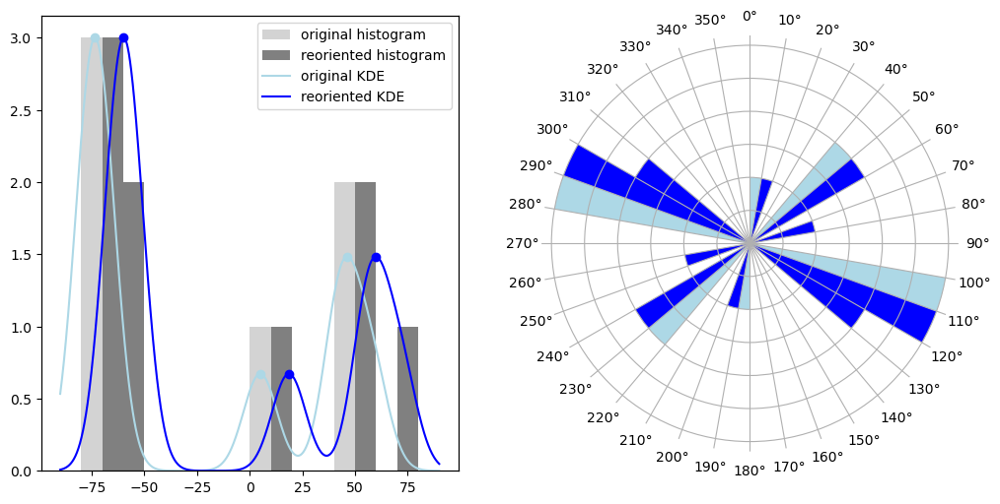

bimodality result:  False


Cluster 1 , time bin 8
N =  0
<10 data points


Cluster 2 , time bin 1
N =  0
<10 data points


Cluster 2 , time bin 2
N =  0
<10 data points


Cluster 2 , time bin 3
N =  0
<10 data points


Cluster 2 , time bin 4
N =  12


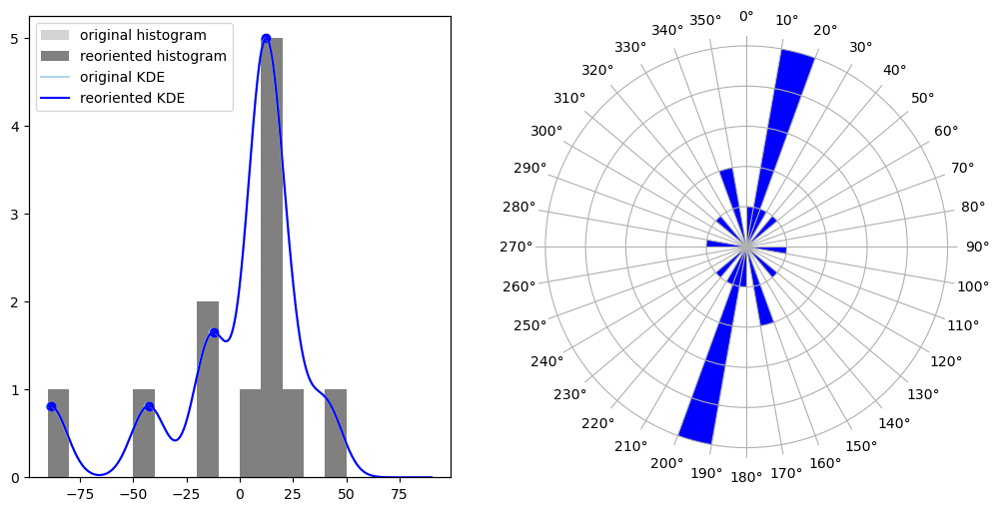

bimodality result:  False


Cluster 2 , time bin 5
N =  12


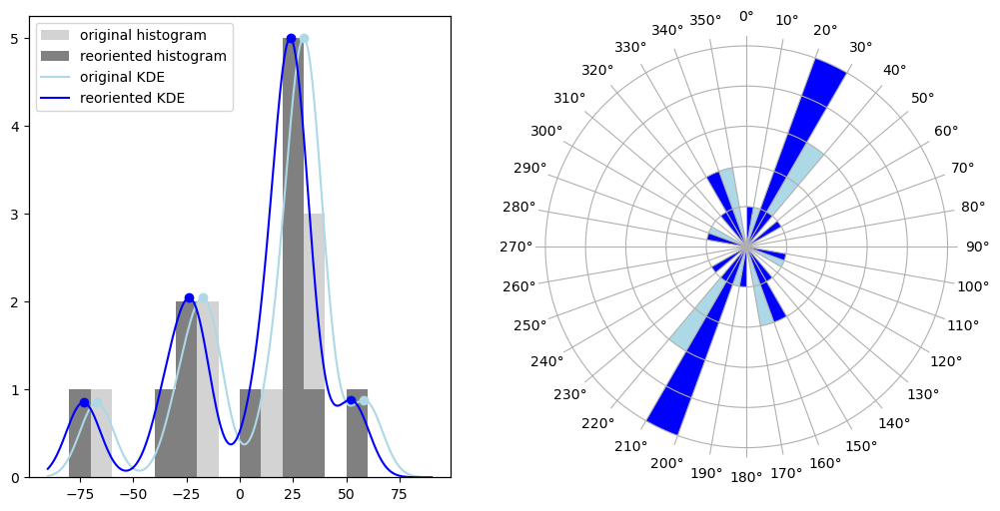

bimodality result:  False


Cluster 2 , time bin 6
N =  24


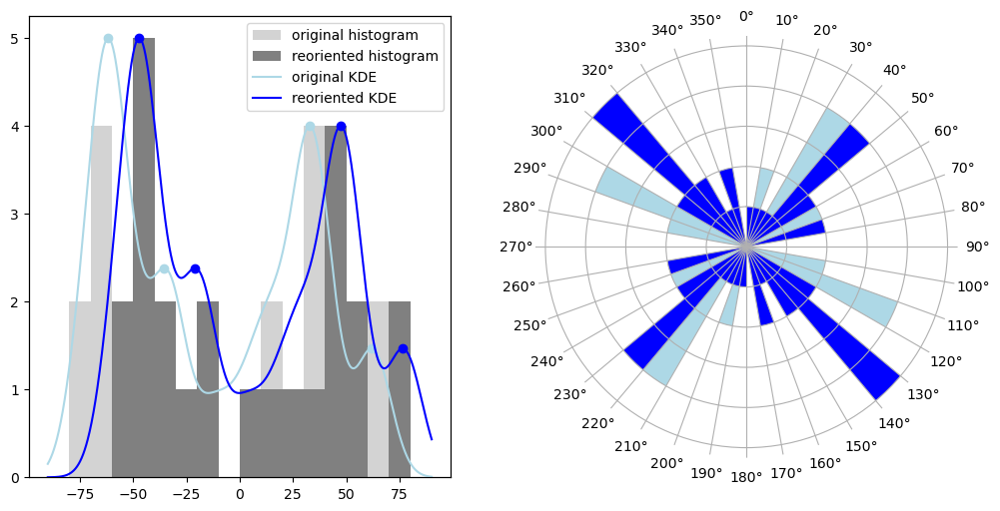

bimodality result:  False


Cluster 2 , time bin 7
N =  79


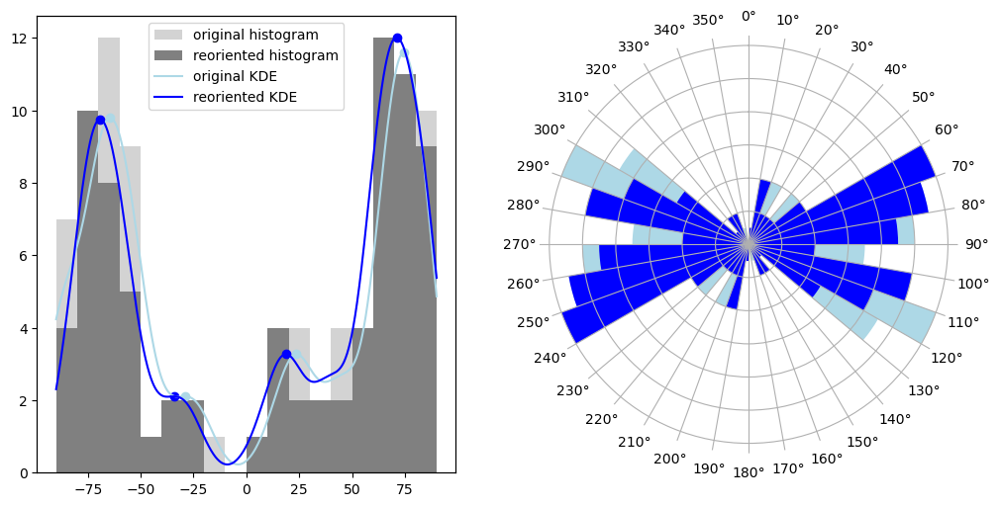

bimodality result:  True


Cluster 2 , time bin 8
N =  6


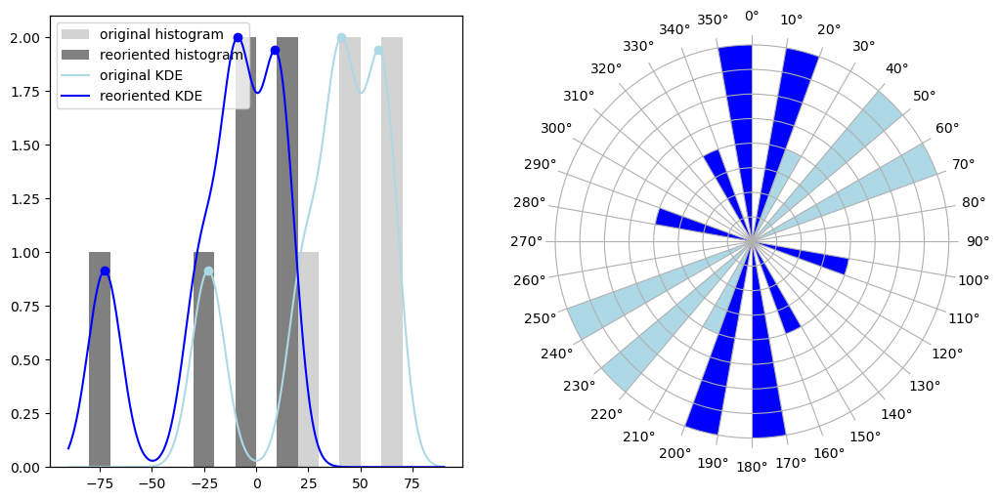

bimodality result:  True


Cluster 3 , time bin 1
N =  32


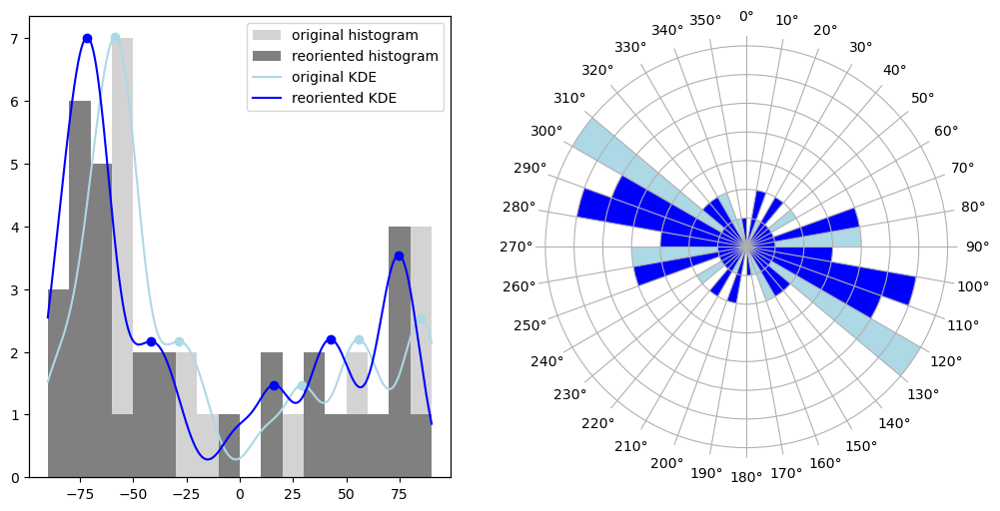

bimodality result:  False


Cluster 3 , time bin 2
N =  183


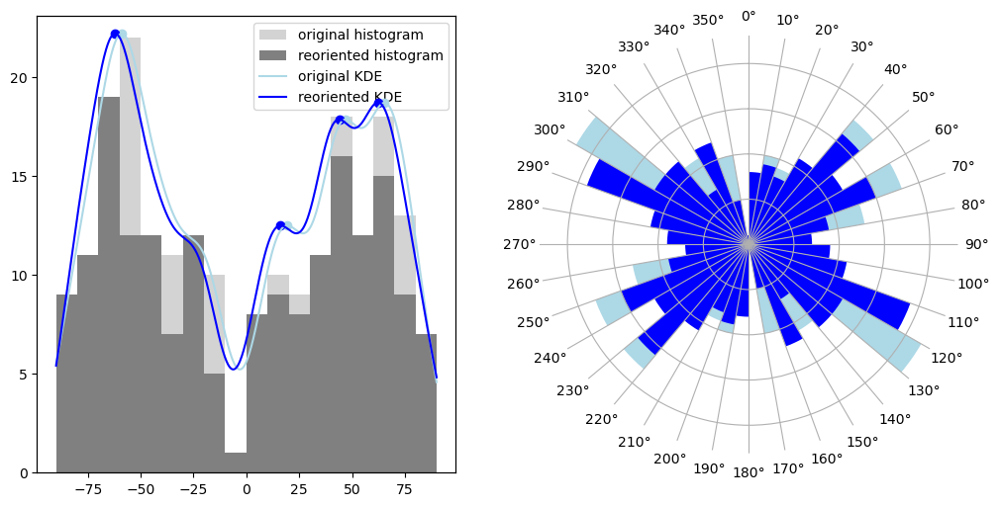

bimodality result:  False


Cluster 3 , time bin 3
N =  25


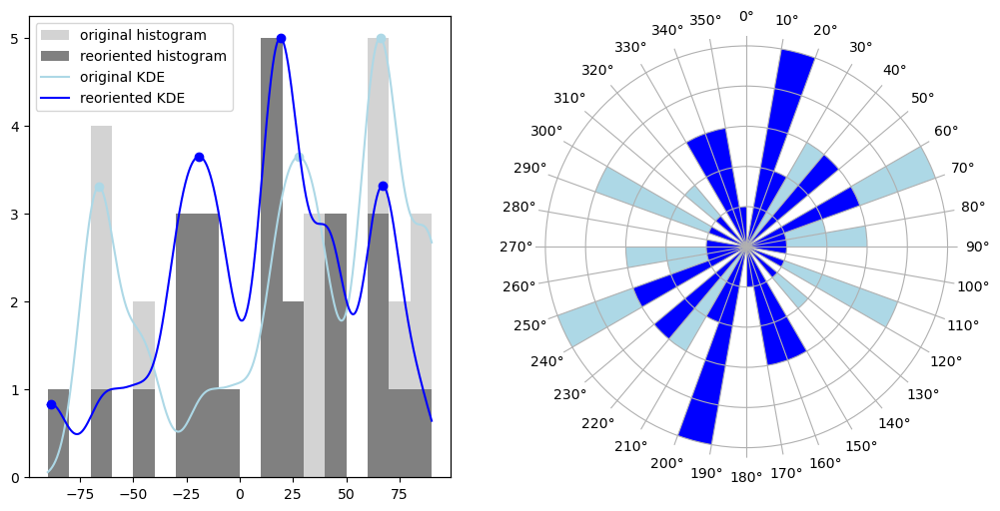

bimodality result:  False


Cluster 3 , time bin 4
N =  34


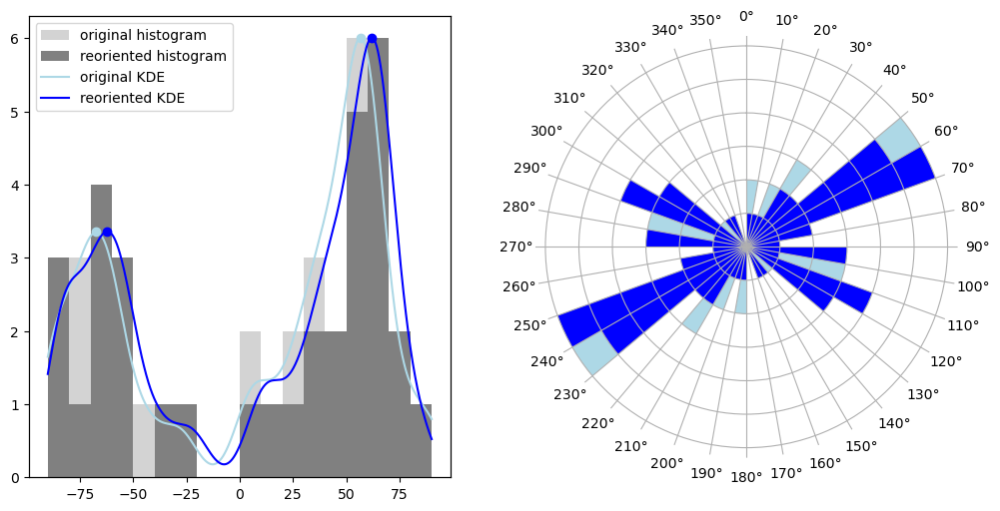

bimodality result:  True


Cluster 3 , time bin 5
N =  8


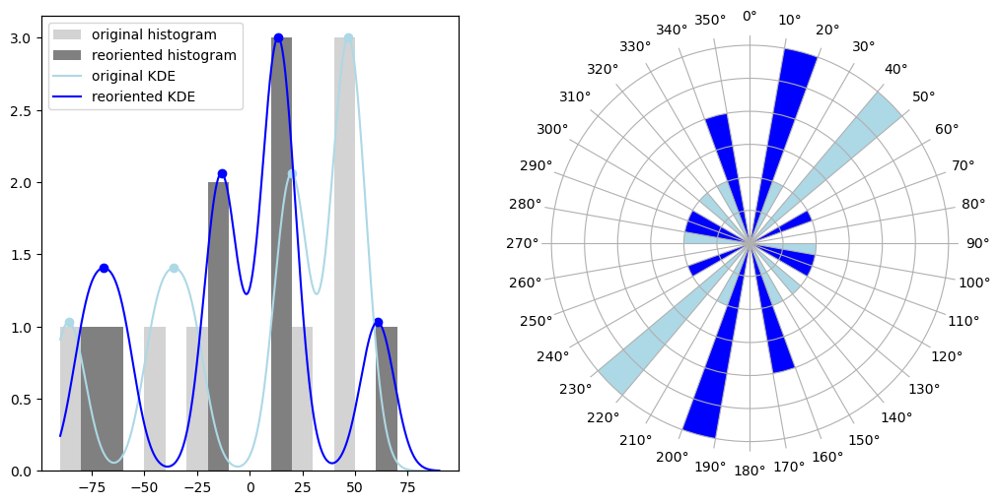

bimodality result:  False


Cluster 3 , time bin 6
N =  7


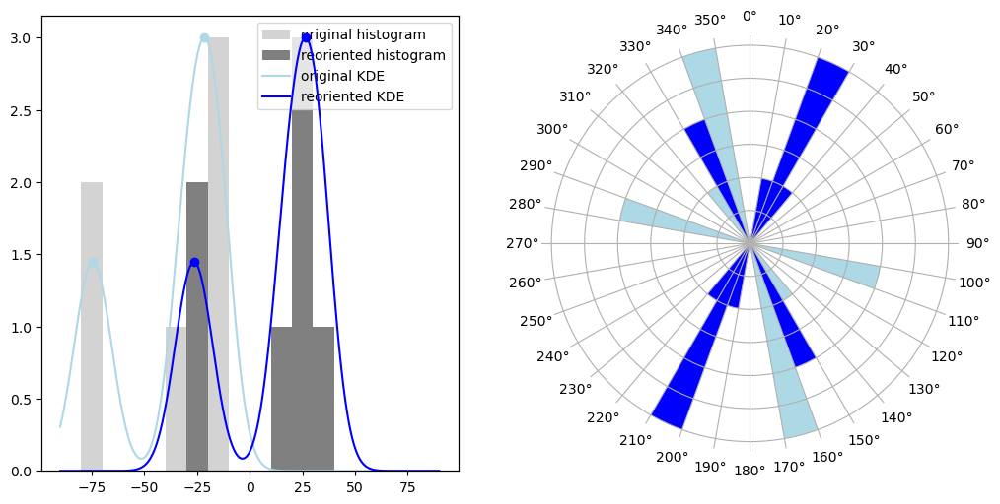

bimodality result:  False


Cluster 3 , time bin 7
N =  0
<10 data points


Cluster 3 , time bin 8
N =  0
<10 data points


Cluster 4 , time bin 1
N =  299


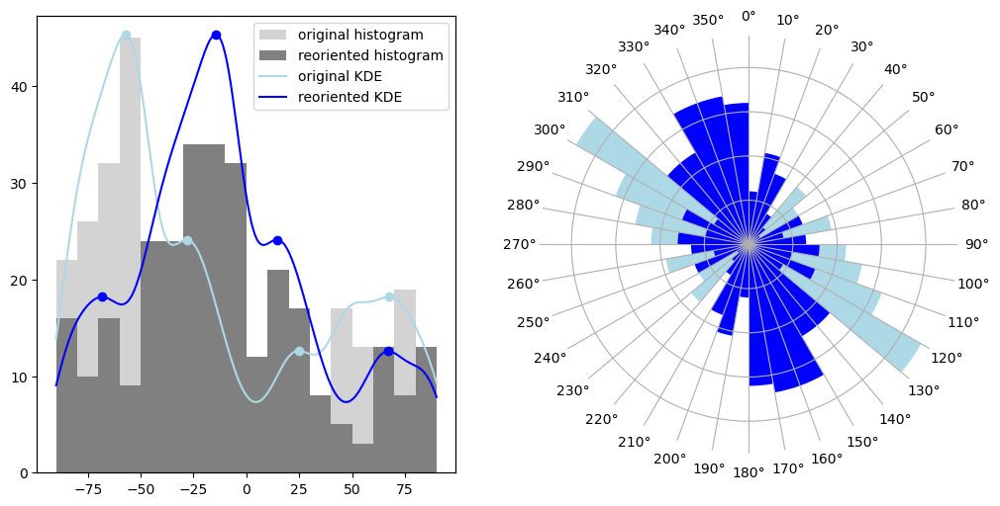

bimodality result:  False


Cluster 4 , time bin 2
N =  105


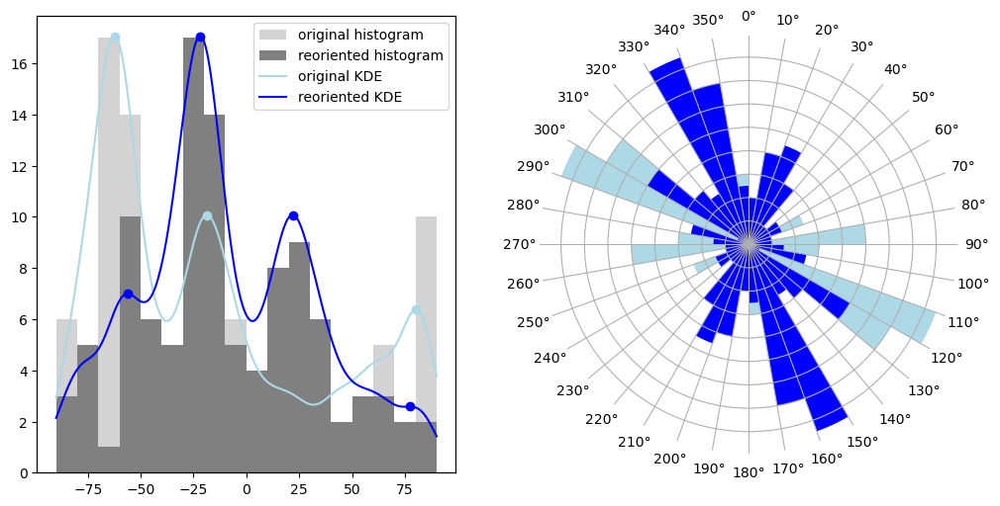

bimodality result:  False


Cluster 4 , time bin 3
N =  21


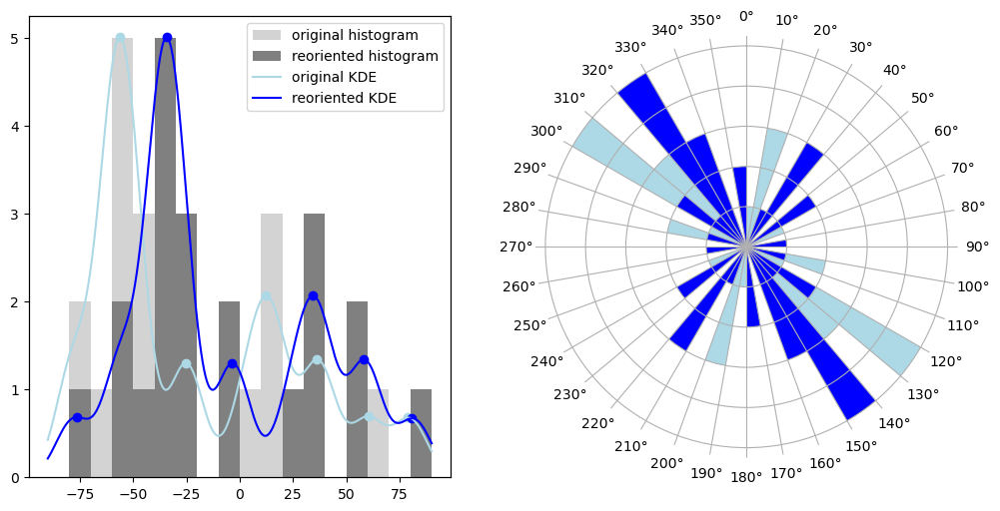

bimodality result:  False


Cluster 4 , time bin 4
N =  16


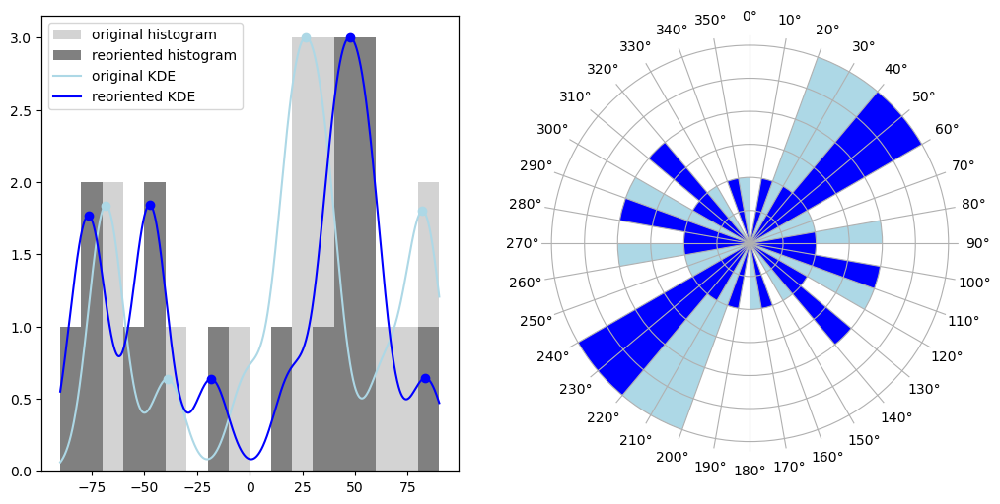

bimodality result:  False


Cluster 4 , time bin 5
N =  0
<10 data points


Cluster 4 , time bin 6
N =  0
<10 data points


Cluster 4 , time bin 7
N =  0
<10 data points


Cluster 4 , time bin 8
N =  0
<10 data points




In [42]:
# Loop over each cluster and time bin
time_bins = range(0, 8)  # Assuming time bins are 0 to 7
clusters = range(0, 5)   # Assuming clusters are 0 to 4

for cluster in clusters:
    for time_bin in time_bins:
        print("Cluster", cluster, ", time bin", time_bin+1)
        # Filter data for current cluster and time bin
        subset = df[(df["Time bin"] == time_bin) & (df["Cluster #"] == cluster)]
        print("N = ", len(subset))
        if subset.size < 10:
            print("<10 data points")
            print("\n")
            continue

        angles = transform_angles(subset["Trend"].values)

        theta, hist = rose_diagram(angles, 10)

        # KDE and peaks
        x_vals = np.linspace(-90, 90, 1000)
        kde_vals = compute_kde(angles, x_vals, bw=8)
        peaks, peak_heights = analyze_peaks(kde_vals, x_vals)

        bimodal, similar_heights, height_check = check_bimodality(angles, bw=8, reorient=True, plot=True)
        print("bimodality result: ", bimodal)
        print("\n")
